In [ ]:
import numpy as np
import pandas as pd
import os
import cv2 as cv
import matplotlib.pyplot as plt
from keras import backend as K
from keras.layers import add, Conv2D,Input
from keras.models import Model, load_model
from keras.callbacks import EarlyStopping, History
from keras.utils import img_to_array, array_to_img
from keras.preprocessing.image import load_img
from keras import backend as K
import tensorflow as tf
from tensorflow.keras.utils import plot_model
from sklearn.metrics import mean_squared_error
from skimage.metrics import structural_similarity as ssim
from sklearn.model_selection import train_test_split
from IPython.display import Image

tf.random.set_seed(1)
np.random.seed(1)
print(os.listdir("/content/extracted_folder/images/images"))
pixel = 256

['food', '.ipynb_checkpoints', 'architecure', 'art', 'travel']


In [ ]:

def noisy(noise_typ, image):
    if noise_typ == "gauss":
        row, col, ch = image.shape
        mean = 0
        var = 0.0001
        sigma = var ** 0.5
        gauss = np.random.normal(mean, sigma, (row, col, ch))
        noisy_image = gauss + image
        return noisy_image
    elif noise_typ == "s&p":
        row, col, ch = image.shape
        s_vs_p = 0.5
        amount = 0.2
        out = np.copy(image)

        
        num_salt = np.ceil(amount * image.size * s_vs_p)
        coords = [np.random.randint(0, i, int(num_salt)) for i in image.shape]

        for i in range(len(coords[0])):
            x, y = coords[0][i], coords[1][i]
            if x < row and y < col: 
                out[x, y] = 1

        
        num_pepper = np.ceil(amount * image.size * (1. - s_vs_p))
        coords = [np.random.randint(0, i, int(num_pepper)) for i in image.shape]

        for i in range(len(coords[0])):
            x, y = coords[0][i], coords[1][i]
            if x < row and y < col:  
                out[x, y] = 0
        return out
    elif noise_typ == "poisson":
        vals = len(np.unique(image))
        vals = 2 ** np.ceil(np.log2(vals))
        noisy_image = np.random.poisson(image * vals) / float(vals)
        return noisy_image
    elif noise_typ == "speckle":
        row, col, ch = image.shape
        gauss = np.random.randn(row, col, ch)
        noisy_image = image + image * gauss
        return noisy_image


In [ ]:

TrainPath_1 = "/content/extracted_folder/images/images/architecure/"
TrainPath_2 = "/content/extracted_folder/images/images/art/"
TrainPath_3 = "/content/extracted_folder/images/images/food/"
TrainPath_4 = "/content/extracted_folder/images/images/travel/"

In [12]:
print(os.listdir("/content/extracted_folder/images/images/"))
print(os.listdir("/content/extracted_folder/validation/validation"))

['food', '.ipynb_checkpoints', 'architecure', 'art', 'travel']
['food', 'architecture', 'art and culture', 'travel and adventure']


<function matplotlib.pyplot.show(close=None, block=None)>

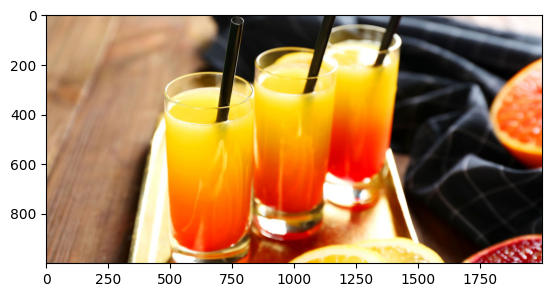

In [ ]:
img = cv.imread(TrainPath_3 + "0 (3).jpg")
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

plt.imshow(img)
l = img.max()
l
plt.show


<function matplotlib.pyplot.show(close=None, block=None)>

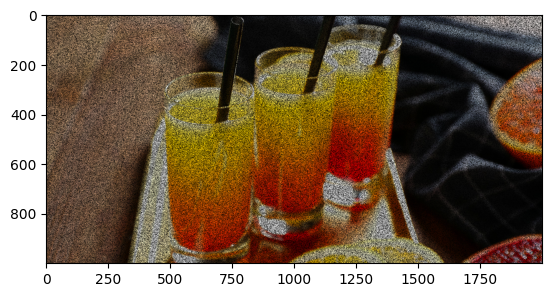

In [14]:
# Add noise and display
Noise = noisy("s&p", img)
plt.imshow(Noise)
plt.show


<function matplotlib.pyplot.show(close=None, block=None)>

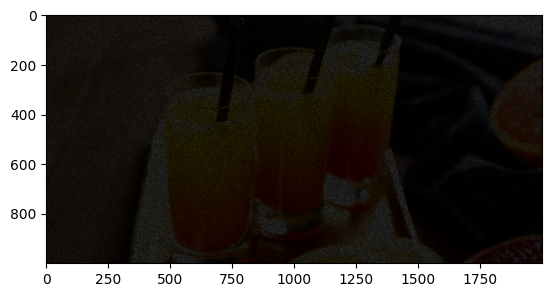

In [15]:
# Convert to HSV and adjust brightness
hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)
hsv[...,2] = hsv[...,2]*0.2
img1 = cv.cvtColor(hsv, cv.COLOR_HSV2BGR)
Noise2 = noisy("s&p", img1)
plt.imshow(Noise2)
plt.show

In [ ]:

def PreProcessData(ImagePath):
    X_ = []
    y_ = []
    count = 0
    for imageDir in os.listdir(ImagePath):
        if count < 1000: 
            try:
                count += 1
                img = cv.imread(ImagePath + imageDir)
                img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
                img_y = cv.resize(img, (pixel, pixel))
                hsv = cv.cvtColor(img_y, cv.COLOR_BGR2HSV)
                hsv[...,2] = hsv[...,2]*0.2
                img_1 = cv.cvtColor(hsv, cv.COLOR_HSV2BGR)
                Noisey_img = noisy("s&p", img_1)
                X_.append(Noisey_img)
                y_.append(img_y)
            except Exception as e:
                print(f"Error processing image {imageDir}: {e}")
    return np.array(X_), np.array(y_)


In [19]:
X_1, y_1 = PreProcessData(TrainPath_1)
print('Shape Dataset X1', X_1.shape, y_1.shape)
X_2, y_2 = PreProcessData(TrainPath_2)
print('Shape Dataset X2', X_2.shape, y_2.shape)
X_3, y_3 = PreProcessData(TrainPath_3)
print('Shape Dataset X3', X_3.shape, y_3.shape)
X_4, y_4 = PreProcessData(TrainPath_3)
print('Shape Dataset X3', X_4.shape, y_4.shape)

# Concatenate the datasets
X_ = np.concatenate((X_1, X_2, X_3, X_4), axis=0)
y_ = np.concatenate((y_1, y_2, y_3, y_4), axis=0)
print('Combined Shape Dataset:', X_.shape, y_.shape)

Shape Dataset X1 (1000, 256, 256, 3) (1000, 256, 256, 3)
Error processing image 834.jpg: OpenCV(4.11.0) /io/opencv/modules/imgproc/src/color.cpp:199: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'

Error processing image 352 (6).jpg: OpenCV(4.11.0) /io/opencv/modules/imgproc/src/color.cpp:199: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'

Error processing image 460 (3).jpg: OpenCV(4.11.0) /io/opencv/modules/imgproc/src/color.cpp:199: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'

Error processing image 497 (2).jpg: OpenCV(4.11.0) /io/opencv/modules/imgproc/src/color.cpp:199: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'

Error processing image 580 (5).jpg: OpenCV(4.11.0) /io/opencv/modules/imgproc/src/color.cpp:199: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'

Error processing image 608 (3).jpg: OpenCV(4.11.0) /io/opencv/modules/imgproc/src/color.cpp:199: error: (-215:Asserti

In [ ]:

X_train, X_val, y_train, y_val = train_test_split(X_, y_, test_size=0.2, random_state=42)

print('Training Set Shape:', X_train.shape, y_train.shape)
print('Validation Set Shape:', X_val.shape, y_val.shape)

Training Set Shape: (3193, 256, 256, 3) (3193, 256, 256, 3)
Validation Set Shape: (799, 256, 256, 3) (799, 256, 256, 3)


In [ ]:

def GenerateInputs(X, y):
    for i in range(len(X)):
        X_input = X[i].reshape(pixel, pixel, 3)
        y_input = y[i].reshape(pixel, pixel, 3)
        yield (X_input, y_input)


train_dataset = tf.data.Dataset.from_generator(
    lambda: GenerateInputs(X_train, y_train),
    output_signature=(
        tf.TensorSpec(shape=(pixel, pixel, 3), dtype=tf.float32),
        tf.TensorSpec(shape=(pixel, pixel, 3), dtype=tf.float32)
    )
)

val_dataset = tf.data.Dataset.from_generator(
    lambda: GenerateInputs(X_val, y_val),
    output_signature=(
        tf.TensorSpec(shape=(pixel, pixel, 3), dtype=tf.float32),
        tf.TensorSpec(shape=(pixel, pixel, 3), dtype=tf.float32)
    )
)


train_dataset = train_dataset.batch(1)
val_dataset = val_dataset.batch(1)



In [ ]:

K.clear_session()

def InstantiateModel(in_):
    model_0 = Conv2D(8, (3, 3), activation='relu', padding='same')(in_)
    model_0 = Conv2D(16, (3, 3), activation='relu', padding='same')(model_0)
    model_0 = Conv2D(32, (3, 3), activation='relu', padding='same')(model_0)
    model_0 = Conv2D(64, (2, 2), activation='relu', padding='same')(model_0)

    model_1 = Conv2D(16, (3, 3), activation='relu', padding='same')(in_)
    model_1 = Conv2D(32, (3, 3), activation='relu', padding='same')(model_1)
    model_1 = Conv2D(64, (2, 2), activation='relu', padding='same')(model_1)

    model_2 = Conv2D(32, (3, 3), activation='relu', padding='same')(in_)
    model_2 = Conv2D(64, (2, 2), activation='relu', padding='same')(model_2)

    model_2_0 = Conv2D(64, (2, 2), activation='relu', padding='same')(in_)

    model_add = add([model_0, model_1, model_2, model_2_0])

    model_3 = Conv2D(64, (3, 3), activation='relu', padding='same')(model_add)
    model_3 = Conv2D(32, (3, 3), activation='relu', padding='same')(model_3)
    model_3 = Conv2D(16, (2, 2), activation='relu', padding='same')(model_3)

    model_3_1 = Conv2D(32, (3, 3), activation='relu', padding='same')(model_add)
    model_3_1 = Conv2D(16, (2, 2), activation='relu', padding='same')(model_3_1)

    model_3_2 = Conv2D(16, (2, 2), activation='relu', padding='same')(model_add)

    model_add_2 = add([model_3_1, model_3_2, model_3])

    model_4 = Conv2D(16, (3, 3), activation='relu', padding='same')(model_add_2)
    model_4_1 = Conv2D(16, (3, 3), activation='relu', padding='same')(model_add)
    
    model_add_3 = add([model_3, model_4_1, model_add_2, model_4])

    model_5 = Conv2D(16, (3, 3), activation='relu', padding='same')(model_add_3)
    model_5 = Conv2D(16, (2, 2), activation='relu', padding='same')(model_add_3)
    model_5 = Conv2D(3, (3, 3), activation='relu', padding='same')(model_5)

    return model_5


Input_Sample = Input(shape=(pixel, pixel, 3))
Output_ = InstantiateModel(Input_Sample)
Model_Enhancer = Model(inputs=Input_Sample, outputs=Output_)


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 256, 256, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 256, 256, 8)    │            224 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 256, 256, 16)   │          1,168 │ conv2d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 256, 256, 16)   │            448 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 256, 256, 32)   │          4,640 │ conv2d_1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 256, 256, 32)   │          4,640 │ conv2d_4[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_7 (Conv2D)         │ (None, 256, 256, 32)   │            896 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 256, 256, 64)   │          8,256 │ conv2d_2[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_6 (Conv2D)         │ (None, 256, 256, 64)   │          8,256 │ conv2d_5[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_8 (Conv2D)         │ (None, 256, 256, 64)   │          8,256 │ conv2d_7[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_9 (Conv2D)         │ (None, 256, 256, 64)   │            832 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 256, 256, 64)   │              0 │ conv2d_3[0][0],        │
│                           │                        │                │ conv2d_6[0][0],        │
│                           │                        │                │ conv2d_8[0][0],        │
│                           │                        │                │ conv2d_9[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_10 (Conv2D)        │ (None, 256, 256, 64)   │         36,928 │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_11 (Conv2D)        │ (None, 256, 256, 32)   │         18,464 │ conv2d_10[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_13 (Conv2D)        │ (None, 256, 256, 32)   │         18,464 │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_12 (Conv2D)        │ (None, 256, 256, 16)   │          2,064 │ conv2d_11[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_14 (Conv2D)        │ (None, 256, 256, 16)   │          2,064 │ conv2d_13[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_15 (Conv2D)        │ (None, 256, 256, 16)   │          4,112 │ add[0][0]              │
├──────────────────────

 Total params: 132,739 (518.51 KB)

 Trainable params: 132,739 (518.51 KB)

 Non-trainable params: 0 (0.00 B)

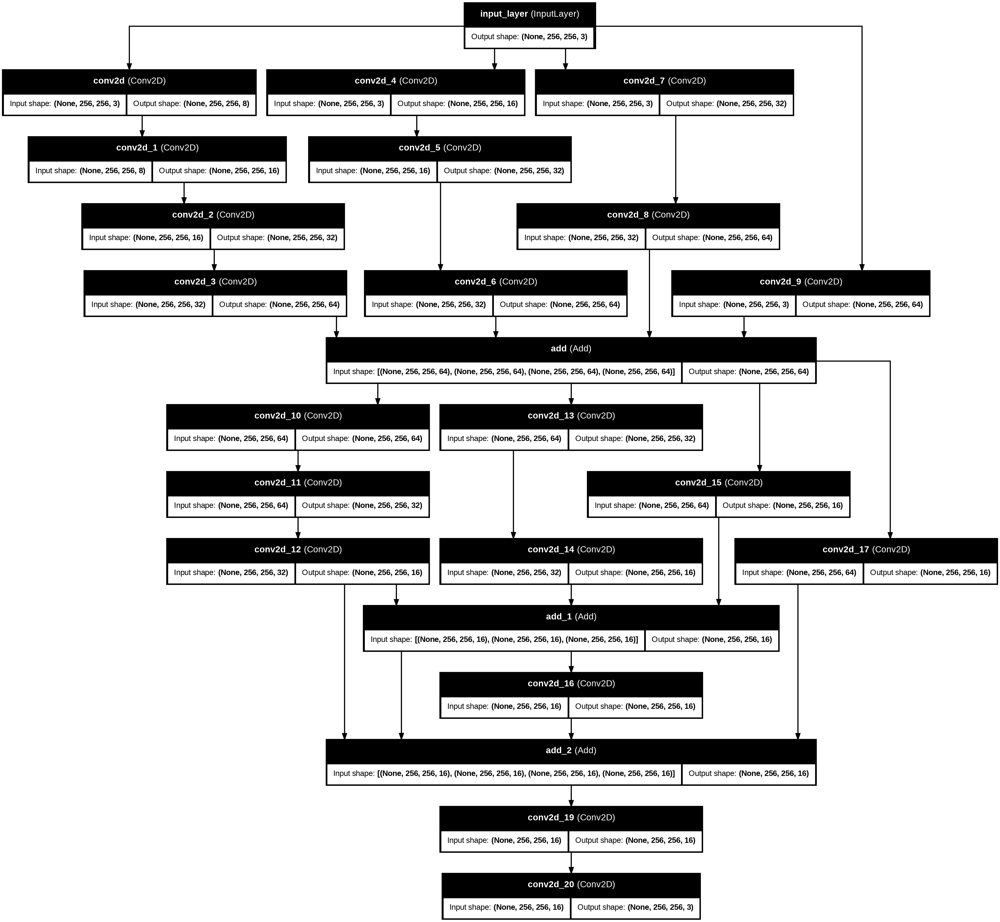

In [ ]:

Model_Enhancer.compile(optimizer="adam", loss='mean_squared_error')
Model_Enhancer.summary()

plot_model(Model_Enhancer, to_file='Model_Enhancer.png', show_shapes=True, show_layer_names=True)
Image(retina=True, filename='Model_Enhancer.png')

In [ ]:

early_stopping_1 = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)


history_1 = History()


In [ ]:

history_1 = Model_Enhancer.fit(
    train_dataset,
    epochs=100,
    verbose=1,
    steps_per_epoch=100,
    shuffle=True,
    validation_data=val_dataset,
    callbacks=[history_1, early_stopping_1]
)

Epoch 1/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 25s 110ms/step - loss: 6938.0049 - val_loss: 1160.0824
Epoch 2/100
  5/100 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 1196.9872

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


100/100 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - loss: 988.2054 - val_loss: 569.9823
Epoch 3/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 476.0848 - val_loss: 400.2886
Epoch 4/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 10s 104ms/step - loss: 412.5564 - val_loss: 414.3219
Epoch 5/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - loss: 263.7841 - val_loss: 398.5414
Epoch 6/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 9s 89ms/step - loss: 330.4700 - val_loss: 282.5729
Epoch 7/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 313.9078 - val_loss: 270.6788
Epoch 8/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 285.2903 - val_loss: 207.6369
Epoch 9/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 9s 94ms/step - loss: 262.6924 - val_loss: 180.4478
Epoch 10/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 9s 89ms/step - loss: 185.1964 - val_loss: 168.3190
Epoch 11/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - loss: 177.6413 - val_loss: 182.6210
Epoch 12/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 9s 94ms/step - loss: 152.1031 - val_loss: 

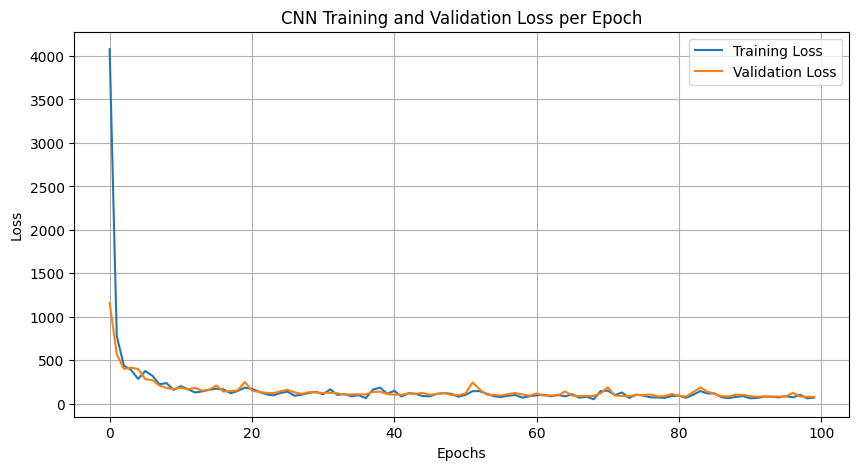

In [ ]:


Model_Enhancer.save("real_mass.h5")

plt.figure(figsize=(10, 5))
plt.plot(history_1.history['loss'], label='Training Loss')
plt.plot(history_1.history['val_loss'], label='Validation Loss')
plt.title('CNN Training and Validation Loss per Epoch')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()



In [ ]:

TestPath_1 = "/content/extracted_folder/validation/validation/architecture/"
TestPath_2 = "/content/extracted_folder/validation/validation/art and culture/"
TestPath_3 = "/content/extracted_folder/validation/validation/food/"
TestPath_4 = "/content/extracted_folder/validation/validation/travel/"

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
PSNR: 35.59153585248641
MSE: 17.944310506184895
SSIM: 0.9792388047254942
LOE: 90.93476867675781
SNM: 2.3119637109994295


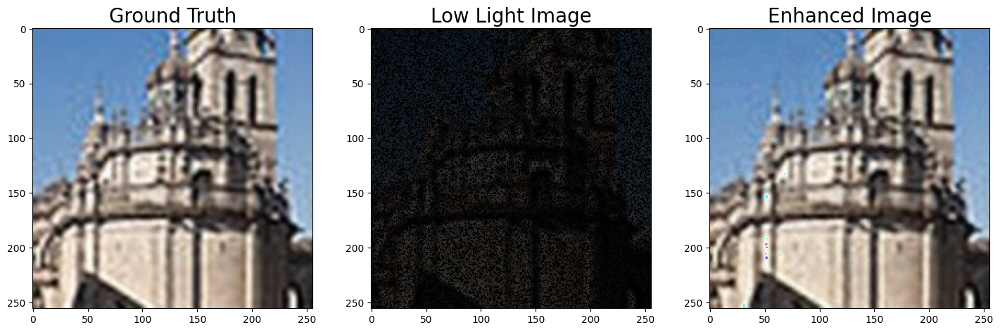

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
PSNR: 37.27563205285535
MSE: 12.176350911458334
SSIM: 0.9820812596932865
LOE: 92.76702880859375
SNM: 1.8687467949851495


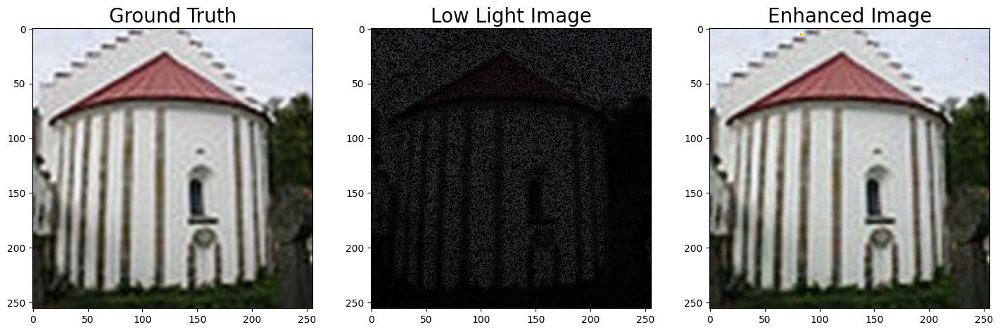

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
PSNR: 39.995533537701235
MSE: 6.5091908772786455
SSIM: 0.9615500225855472
LOE: 94.98431396484375
SNM: 2.51047362359998


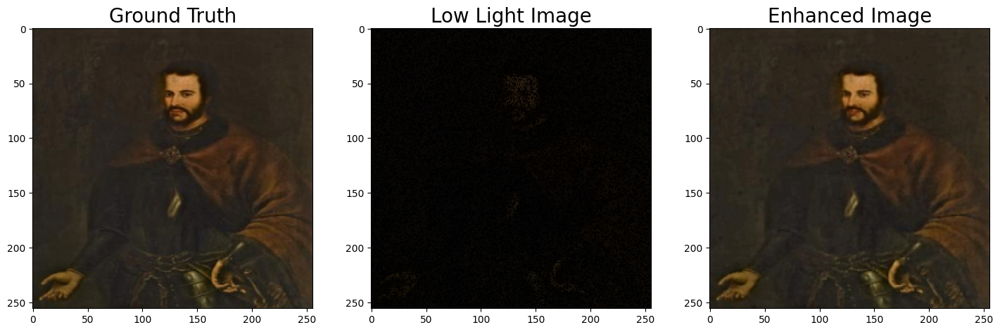

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
PSNR: 39.760036954674206
MSE: 6.871897379557292
SSIM: 0.9611905094912432
LOE: 93.6607666015625
SNM: 2.509611458545058


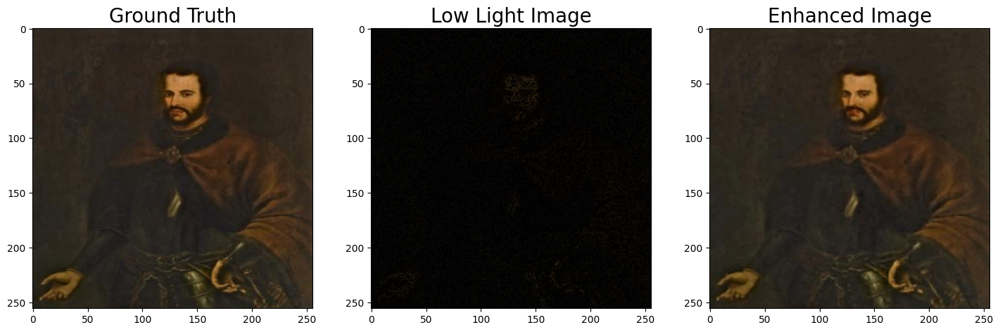

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
PSNR: 33.94917580115002
MSE: 26.19164530436198
SSIM: 0.9173412770862431
LOE: 98.30258178710938
SNM: 1.274185987366224


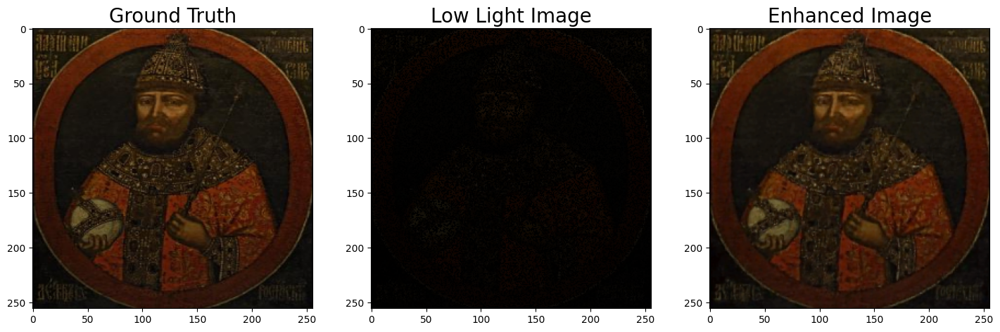

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
PSNR: 34.303780624881654
MSE: 24.13805643717448
SSIM: 0.9337128435967771
LOE: 87.61448669433594
SNM: 1.5587037801019676


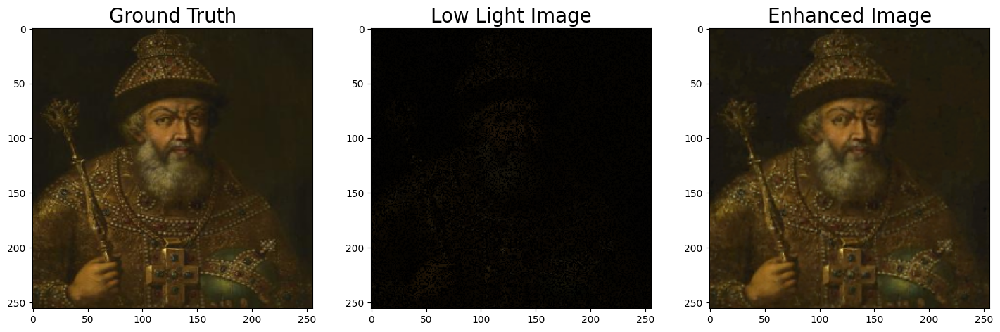

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
PSNR: 34.856690388778276
MSE: 21.2525634765625
SSIM: 0.9662888434294348
LOE: 104.38114929199219
SNM: 2.1553374093993574


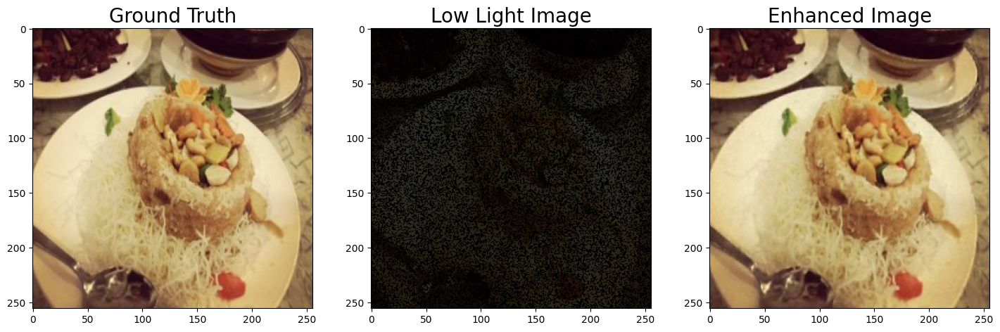

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
PSNR: 21.750276871558412
MSE: 434.56292724609375
SSIM: 0.9502837477291733
LOE: 103.43991088867188
SNM: 1.7068345338684445


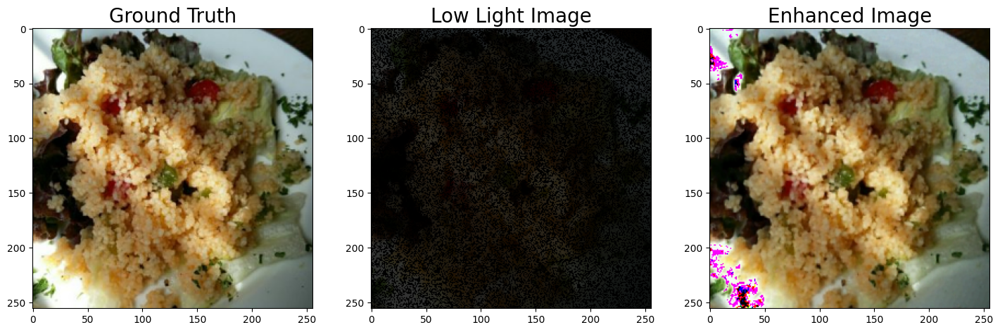

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
PSNR: 36.9559325015521
MSE: 13.106511433919271
SSIM: 0.9651745065516998
LOE: 81.69676208496094
SNM: 2.794214354182357


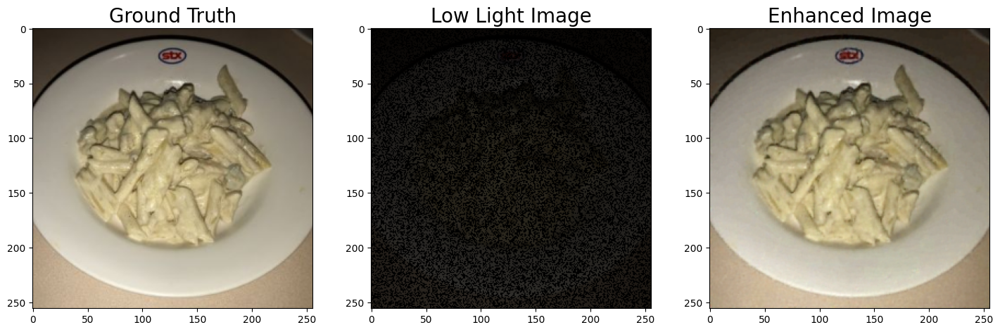

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
PSNR: 33.56091854105643
MSE: 28.641021728515625
SSIM: 0.9676645981558757
LOE: 99.77598571777344
SNM: 1.5881460841272352


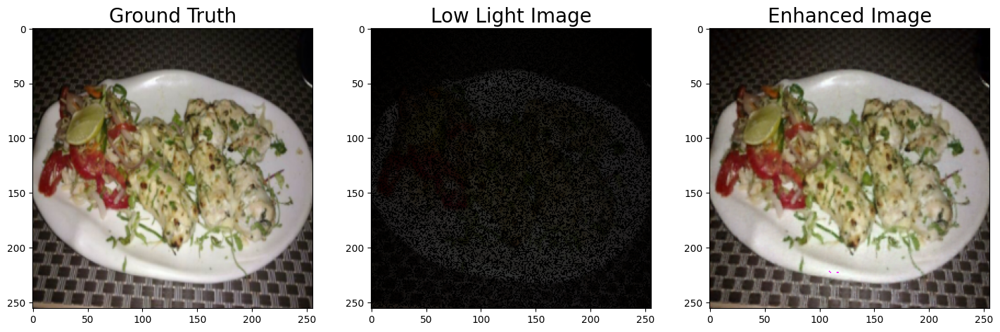

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
PSNR: 18.481148001711553
MSE: 922.4982706705729
SSIM: 0.7519796821197255
LOE: 83.23118591308594
SNM: 1.3153689829426432


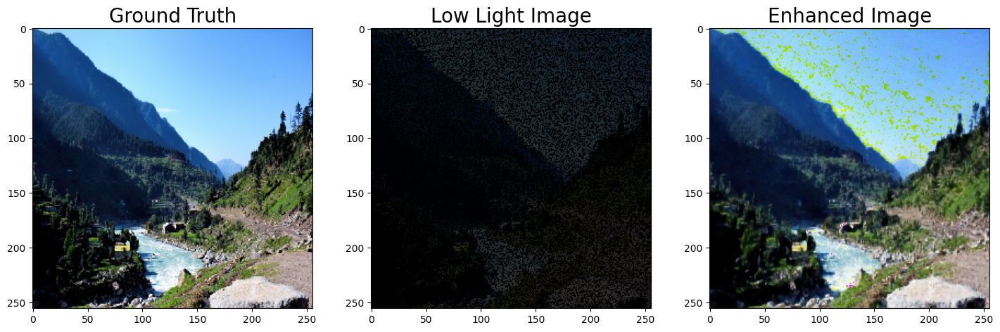

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
PSNR: 12.428887785512082
MSE: 3716.9916229248047
SSIM: 0.7324639550301525
LOE: 107.61016845703125
SNM: 1.173226298863647


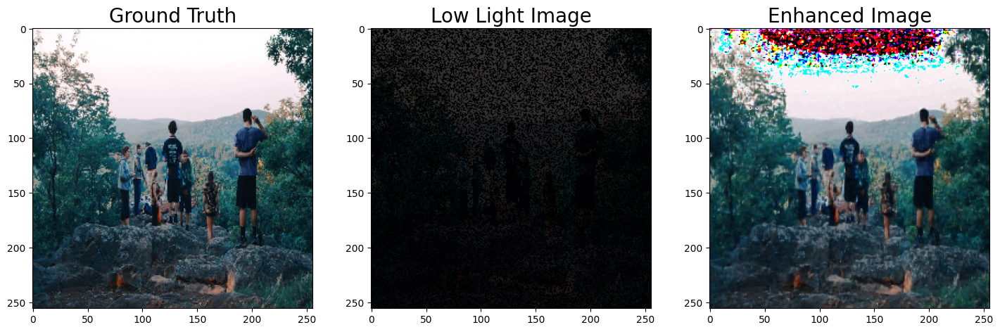

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
PSNR: 26.711783977871878
MSE: 138.64428202311197
SSIM: 0.894696431642823
LOE: 93.35136413574219
SNM: 1.644344923780987


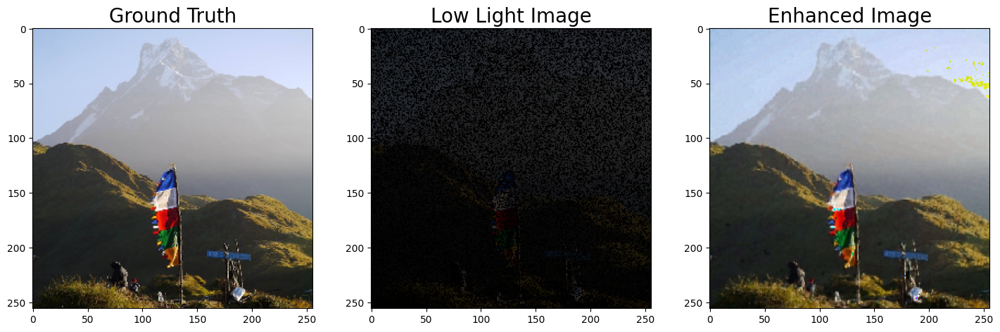

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
PSNR: 27.338450728829045
MSE: 120.01493326822917
SSIM: 0.8793793449229804
LOE: 93.19700622558594
SNM: 2.427889723697773


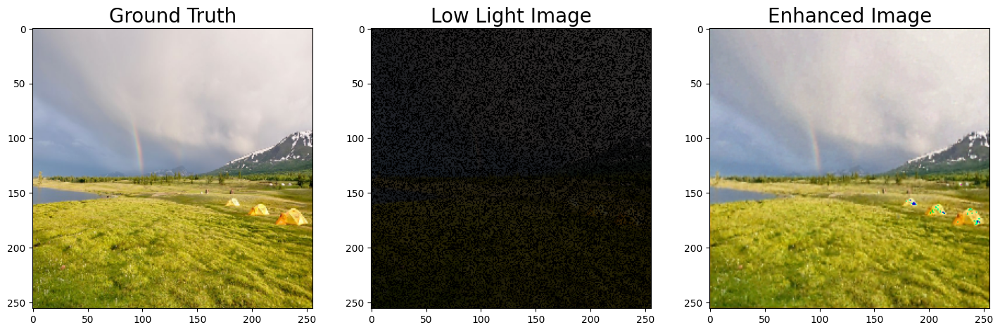

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
PSNR: 26.945995122982843
MSE: 131.3653564453125
SSIM: 0.8655325411740294
LOE: 121.43681335449219
SNM: 1.7108654677569675


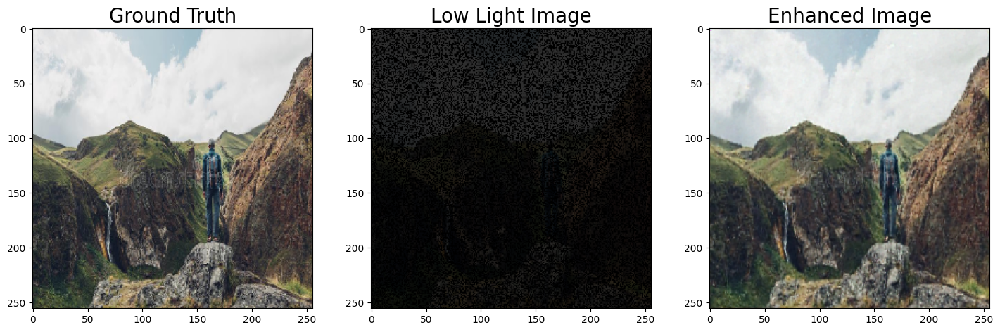

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
PSNR: 26.228532648486713
MSE: 154.9626719156901
SSIM: 0.8462466357244728
LOE: 104.25428771972656
SNM: 1.4945403932123538


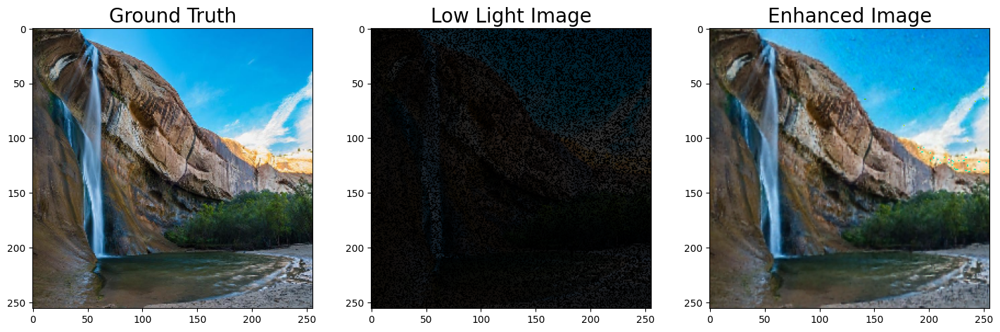

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
PSNR: 29.905384934954398
MSE: 66.45717366536458
SSIM: 0.8978777010220688
LOE: 86.02511596679688
SNM: 3.0000915219659685


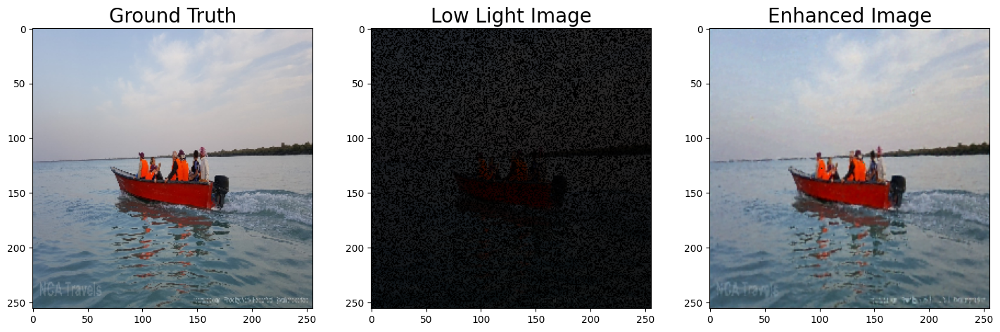

In [ ]:

def ExtractTestInput(ImagePath):
    img = cv.imread(ImagePath)
    img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    img_ = cv.resize(img, (pixel, pixel))
    hsv = cv.cvtColor(img_, cv.COLOR_BGR2HSV)
    hsv[..., 2] = hsv[..., 2] * 0.2
    img1 = cv.cvtColor(hsv, cv.COLOR_HSV2BGR)
    Noise = noisy("s&p", img1)
    return Noise.reshape(1, pixel, pixel, 3)


def compute_loe(original, enhanced):
    original_gray = cv.cvtColor(original, cv.COLOR_RGB2GRAY)
    enhanced_gray = cv.cvtColor(enhanced, cv.COLOR_RGB2GRAY)
    loe = np.mean(np.abs(original_gray - enhanced_gray))
    return loe


def compute_snm(image):
    mean_val = np.mean(image)
    std_val = np.std(image)
    snm = mean_val / (std_val + 1e-5)  
    return snm

from skimage.metrics import structural_similarity as ssim

def compute_metrics(ground_truth, enhanced_image):
    psnr_value = cv.PSNR(ground_truth, enhanced_image)
    ground_truth_flat = ground_truth.flatten()
    enhanced_image_flat = enhanced_image.flatten()
    mse_value = mean_squared_error(ground_truth_flat, enhanced_image_flat)

    ssim_value = ssim(ground_truth, enhanced_image, win_size=11, channel_axis=-1)
    loe_value = compute_loe(ground_truth, enhanced_image)
    snm_value = compute_snm(enhanced_image)

    return psnr_value, mse_value, ssim_value, loe_value, snm_value

def display_images(test_image_path):
    plt.figure(figsize=(30, 30))
    img_1 = cv.imread(test_image_path)
    img_1 = cv.cvtColor(img_1, cv.COLOR_BGR2RGB)
    img_1 = cv.resize(img_1, (pixel, pixel))
    plt.subplot(5, 5, 1)
    plt.title("Ground Truth", fontsize=20)
    plt.imshow(img_1)

    img_ = ExtractTestInput(test_image_path)
    Prediction = Model_Enhancer.predict(img_)
    img_ = img_.reshape(pixel, pixel, 3)
    plt.subplot(5, 5, 2)
    plt.title("Low Light Image", fontsize=20)
    plt.imshow(img_)

    Prediction = Prediction.reshape(pixel, pixel, 3)
    img_[:, :, :] = Prediction[:, :, :]
    plt.subplot(5, 5, 3)
    plt.title("Enhanced Image", fontsize=20)
    plt.imshow(img_)

    psnr_value, mse_value, ssim_value, loe_value, snm_value = compute_metrics(img_1, img_)
    print(f'PSNR: {psnr_value}')
    print(f'MSE: {mse_value}')
    print(f'SSIM: {ssim_value}')
    print(f'LOE: {loe_value}')
    print(f'SNM: {snm_value}')
    plt.show()

test_images = [
    TestPath_1 + "63px-Catedral_de_Lugo._Galiza.jpg",
    TestPath_1 + "80px-Bosjo_monastery_in_Skane_Sweden5.jpg",
    TestPath_2 + "0002.jpg",
    TestPath_2 + "0002.jpg",
    TestPath_2 + "0003.jpg",
    TestPath_2 + "0004.jpg",
    TestPath_3 + "00EcStbZvxP42pgwGx3W.jpg",
    TestPath_3 + "0B2AZVJVj7cXIkdsguqT.jpg",
    TestPath_3 + "0D1Zwk8gsVUjMSmq5KNK.jpeg",
    TestPath_3 + "0cUPBxt5y8KgjJoMMxxL.png",
    TestPath_4 + "2.jpg",
    TestPath_4 + "14.jpg",
    TestPath_4 + "11.jpg",
    TestPath_4 + "10.jpg",
    TestPath_4 + "12.jpg",
    TestPath_4 + "13.jpg",
    TestPath_4 + "0.jpg"
]

for img_path in test_images:
    display_images(img_path)


In [36]:
tf.__version__

'2.18.0'